<a href="https://colab.research.google.com/github/ychuangab/1st-DL-CVMarathon/blob/master/Day049_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project

`Target:`  Identification model for raccoon and kangaroo    
`Ref:` Day041   

#### Dataset
 * [Kangaroo](https://github.com/experiencor/kangaroo)
 * [Raccoon](https://github.com/experiencor/raccoon_dataset)





In [1]:
%tensorflow_version 1.x # 確保 colob 中使用的 tensorflow 是 1.x 版本而不是 tensorflow 2
import tensorflow as tf
print(tf.__version__)

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `1.x # 確保 colob 中使用的 tensorflow 是 1.x 版本而不是 tensorflow 2`. This will be interpreted as: `1.x`.


TensorFlow 1.x selected.
1.15.0


In [2]:
pip install keras==2.2.4 # 需要安裝 keras 2.2.4 的版本

     |████████████████████████████████| 317kB 8.0MB/s 
  Found existing installation: Keras 2.2.5
    Uninstalling Keras-2.2.5:
      Successfully uninstalled Keras-2.2.5


In [3]:
!nvidia-smi

Wed Mar  4 05:15:07 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.48.02    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    31W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [0]:
import os
#os.environ["CUDA_VISIBLE_DEVICES"]="0"

In [8]:
from google.colab import drive 
drive.mount('/content/gdrive') # 將 google drive 掛載在 colob，
# 下載基於 keras 的 yolov3 程式碼
%cd 'gdrive/My Drive'
# !git clone https://github.com/qqwweee/keras-yolo3 # 如果之前已經下載過就可以註解掉
%cd Learning/1st-DL-CVMarathon/Day49.Final/keras-yolo3

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/My Drive
/content/gdrive/My Drive/Learning/1st-DL-CVMarathon/Day49.Final/keras-yolo3


In [9]:
if not os.path.exists("model_data/yolo.h5"):
  # 下載 yolov3 的網路權重，並且把權重轉換為 keras 能夠讀取的格式
  print("Model doesn't exist, downloading...")
  os.system("wget https://pjreddie.com/media/files/yolov3.weights")
  print("Converting yolov3.weights to yolo.h5...")
  os.system("python convert.py yolov3.cfg yolov3.weights model_data/yolo.h5")
else:
  print("Model exist")

Model exist


In [10]:
# 將資料集格式轉為yolo3的格式
#if True:
if not os.path.exists("animal.txt"):
    labels = open('dataset/labels.csv', 'r')
    line = labels.readline()
    print(line[:-1].split(','))

    list_file = open('animal.txt', 'w')
    file_name = ''
    file_animal = ''

    while line:
        line = labels.readline()
        if line == '':
            break

        line_messages = line[:-1].split(',')
        print(line_messages)

        if file_name == line_messages[0]:
            list_file.write(' ' + line_messages[4] + ',' + line_messages[5] + ',' + line_messages[6] + ',' + line_messages[7] + ',' + file_animal)
        else:
            if file_name != '':
                list_file.write('\n')

            file_name = line_messages[0]
            if line_messages[3] == 'kangaroo':
                list_file.write('dataset/images/' + file_name + ' ' + line_messages[4] + ',' + line_messages[5] + ',' + line_messages[6] + ',' + line_messages[7] + ',0')
                file_animal = '0'
            else:
                list_file.write('dataset/images/' + file_name + ' ' + line_messages[4] + ',' + line_messages[5] + ',' + line_messages[6] + ',' + line_messages[7] + ',1')
                file_animal = '1'

    list_file.close()
else:
    print("animal.txt exist")

animal.txt exist


In [11]:
# 將 train.py 所需要的套件載入
import numpy as np
import keras.backend as K
from keras.layers import Input, Lambda
from keras.models import Model
from keras.optimizers import Adam
from keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

from yolo3.model import preprocess_true_boxes, yolo_body, tiny_yolo_body, yolo_loss
from yolo3.utils import get_random_data

Using TensorFlow backend.


In [0]:
from train import get_classes, get_anchors, create_model, create_tiny_model, data_generator, data_generator_wrapper

In [13]:
if not os.path.exists("model_data/yolo_weights.h5"):
  print("Converting pretrained YOLOv3 weights for training")
  os.system("python convert.py -w yolov3.cfg yolov3.weights model_data/yolo_weights.h5") 
else:
  print("Pretrained weights exists")

Pretrained weights exists


In [0]:
annotation_path = 'animal.txt' # 轉換好格式的標註檔案
log_dir = 'logs/000/' # 訓練好的模型儲存的路徑
classes_path = 'model_data/animal_classes.txt'
anchors_path = 'model_data/yolo_anchors.txt'
class_names = get_classes(classes_path)
num_classes = len(class_names)
anchors = get_anchors(anchors_path)

input_shape = (416,416) # multiple of 32, hw

In [15]:
is_tiny_version = len(anchors)==6 # default setting
if is_tiny_version:
    print("Create tiny model")
    model = create_tiny_model(input_shape, anchors, num_classes, freeze_body=2, weights_path='model_data/tiny_yolo_weights.h5')
else:
    print("Create model")
    model = create_model(input_shape, anchors, num_classes, freeze_body=2, weights_path='model_data/yolo_weights.h5') # make sure you know what you freeze

Create model













Create YOLOv3 model with 9 anchors and 2 classes.


/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_59 due to mismatch in shape ((1, 1, 1024, 21) vs (255, 1024, 1, 1)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_59 due to mismatch in shape ((21,) vs (255,)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_67 due to mismatch in shape ((1, 1, 512, 21) vs (255, 512, 1, 1)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_67 due to mismatch in shape ((21,) vs (255,)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_75 due to mismatch in shape ((1,

Load weights model_data/yolo_weights.h5.
Freeze the first 249 layers of total 252 layers.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [0]:
logging = TensorBoard(log_dir=log_dir)
checkpoint = ModelCheckpoint(
    log_dir + 'ep{epoch:03d}-loss{loss:.3f}-val_loss{val_loss:.3f}.h5',
    monitor='val_loss', save_weights_only=True, save_best_only=True, period=3)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1)

In [17]:
# 分為 training 以及 validation
val_split = 0.1
with open(annotation_path) as f:
    lines = f.readlines()
np.random.seed(10101)
np.random.shuffle(lines)
np.random.seed(None)
num_val = int(len(lines)*val_split)
num_train = int(len(lines) - num_val)
print("total:", int(len(lines)), "val:", num_val, "train:", num_train)

total: 364 val: 36 train: 328


In [24]:
# Train with frozen layers first, to get a stable loss.
# Adjust num epochs to your dataset. This step is enough to obtain a not bad model.
# 一開始先 freeze YOLO 除了 output layer 以外的 darknet53 backbone 來 train

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

if True:
    model.compile(optimizer=Adam(lr=1e-3), loss={
        # use custom yolo_loss Lambda layer.
        'yolo_loss': lambda y_true, y_pred: y_pred})

    batch_size = 16
    print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
    # 模型利用 generator 產生的資料做訓練，強烈建議大家去閱讀及理解 data_generator_wrapper 在 train.py 中的實現
    model.fit_generator(
      data_generator_wrapper(lines[:num_train], batch_size, input_shape, anchors, num_classes),
      steps_per_epoch=max(1, num_train//batch_size),
      validation_data=data_generator_wrapper(lines[num_train:], batch_size, input_shape, anchors, num_classes),
      validation_steps=max(1, num_val//batch_size),
      epochs = 150,
      initial_epoch = 0,
      #callbacks=[logging, checkpoint]
      callbacks=[checkpoint]
      )
    model.save_weights(log_dir + 'trained_weights_stage_1.h5')


Train on 328 samples, val on 36 samples, with batch size 16.


Epoch 1/150
20/20 [==============================] - 170s 9s/step - loss: 3102.6039 - val_loss: 767.6971
Epoch 2/150
20/20 [==============================] - 25s 1s/step - loss: 444.0826 - val_loss: 245.7440
Epoch 3/150
20/20 [==============================] - 24s 1s/step - loss: 204.3457 - val_loss: 159.7811
Epoch 4/150
20/20 [==============================] - 12s 599ms/step - loss: 146.8142 - val_loss: 114.3543
Epoch 5/150
20/20 [==============================] - 24s 1s/step - loss: 116.4913 - val_loss: 95.8672
Epoch 6/150
20/20 [==============================] - 24s 1s/step - loss: 97.9878 - val_loss: 81.9591
Epoch 7/150
20/20 [==============================] - 24s 1s/step - loss: 84.5851 - val_loss: 71.7631
Epoch 8/150
20/20 [==============================] - 24s 1s/step - loss: 74.9063 - val_loss: 61.1088
Epoch 9/150
20/20 [==============================] - 24s 1s/step - loss: 67.7820 - val_loss: 54.7809
Epoch 10/150


In [0]:
### Verify
#Use the snapshot of the example video

In [18]:
!ls ../video_stream

k_1.png  k_3.png  k_5.png  r_2.png  r_4.png
k_2.png  k_4.png  r_1.png  r_3.png  r_5.png


In [25]:
#model_path=log_dir + 'trained_weights_final.h5'
#model_path=log_dir + 'trained_weights_stage_1.h5'
#model_path=log_dir + 'ep048-loss20.487-val_loss19.567.h5'
model_path=log_dir + 'ep147-loss16.502-val_loss15.338.h5'
classes_path = 'model_data/animal_classes.txt'
print(model_path)

logs/000/ep147-loss16.502-val_loss15.338.h5


In [0]:
from PIL import Image
from yolo import YOLO

In [27]:
yolo_model = YOLO(
    model_path=model_path, 
    classes_path=classes_path)

logs/000/ep147-loss16.502-val_loss15.338.h5 model, anchors, and classes loaded.


In [0]:
files = []

for r, d, f in os.walk('../video_stream'):
    for file in f:
        if '.png' in file:
            files.append(os.path.join(r, file))

--- ../video_stream/k_1.png ---
(416, 416, 3)
Found 1 boxes for img
kangaroo 0.90 (663, 110) (1008, 639)
1.8322650449999855


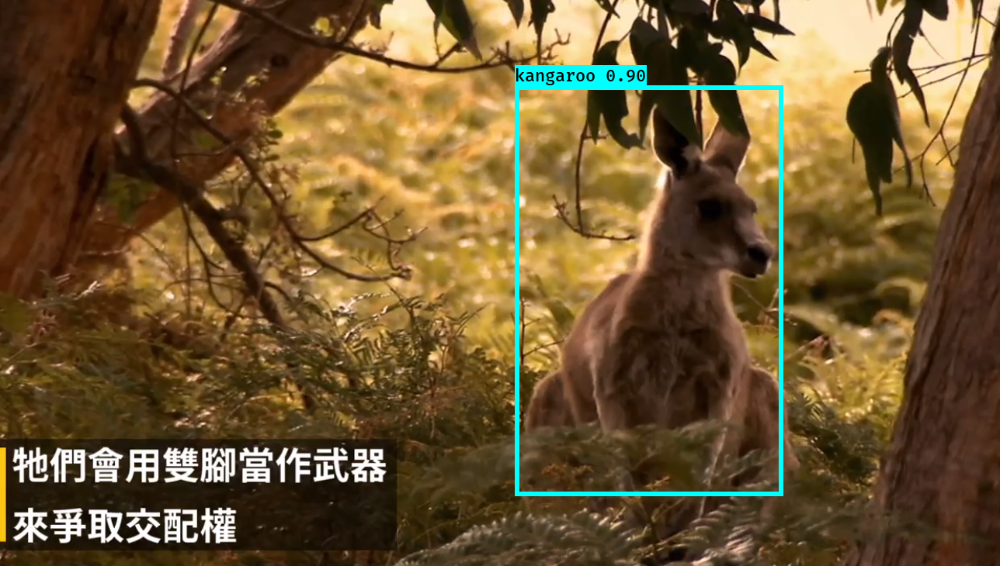

--- ../video_stream/k_2.png ---
(416, 416, 3)
Found 1 boxes for img
kangaroo 0.84 (378, 0) (1267, 746)
0.11294646799979091


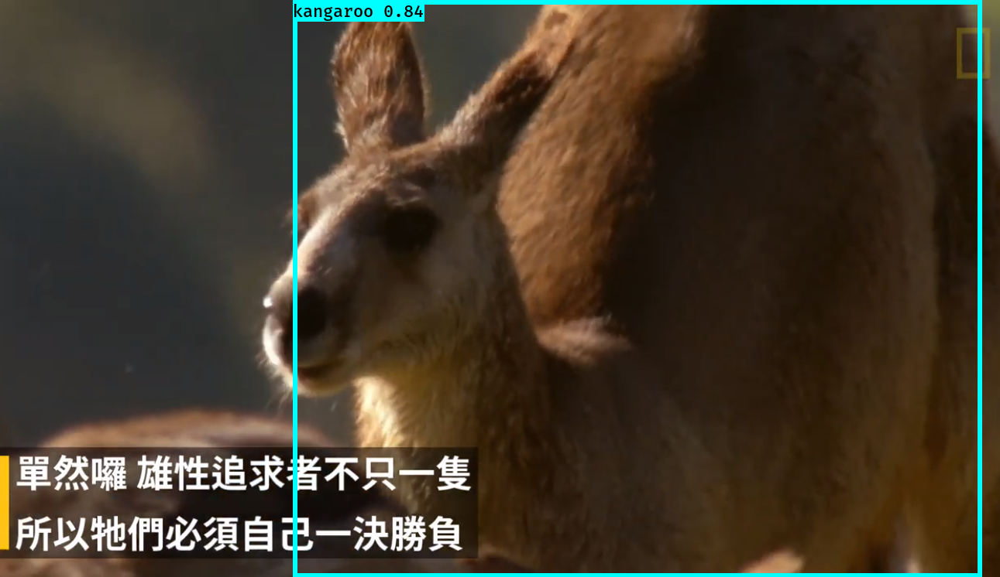

--- ../video_stream/r_2.png ---
(416, 416, 3)
Found 1 boxes for img
raccoon 0.73 (257, 294) (559, 554)
0.11121106999962649


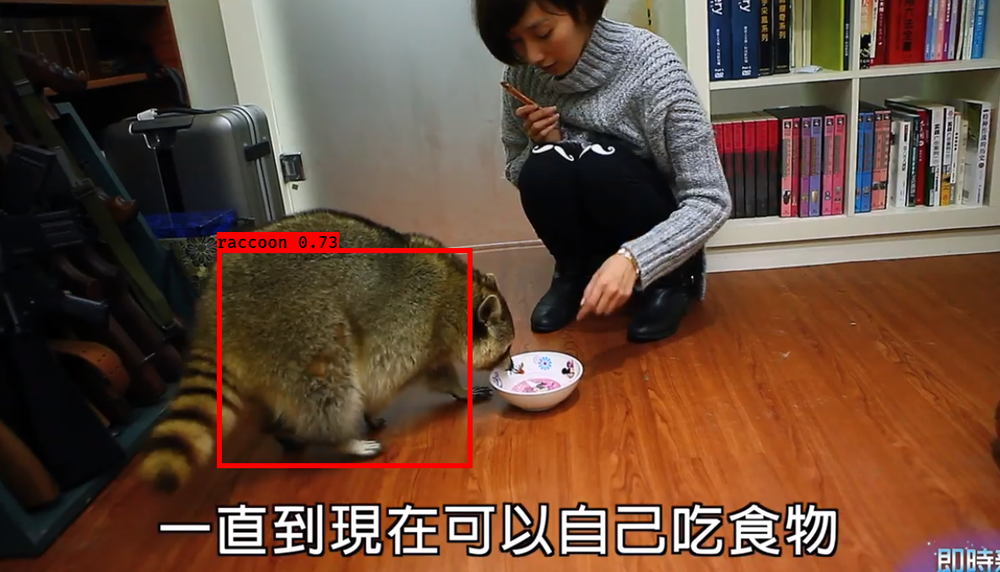

--- ../video_stream/k_5.png ---
(416, 416, 3)
Found 1 boxes for img
raccoon 0.95 (485, 42) (1060, 737)
0.12795797899980244


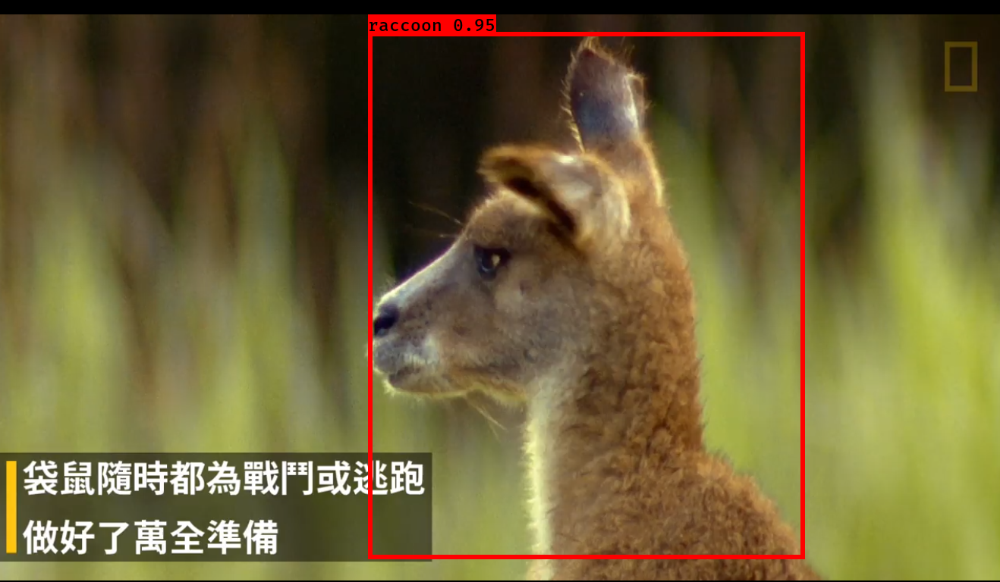

--- ../video_stream/r_4.png ---
(416, 416, 3)
Found 1 boxes for img
raccoon 0.95 (325, 0) (758, 724)
0.11235188099999505


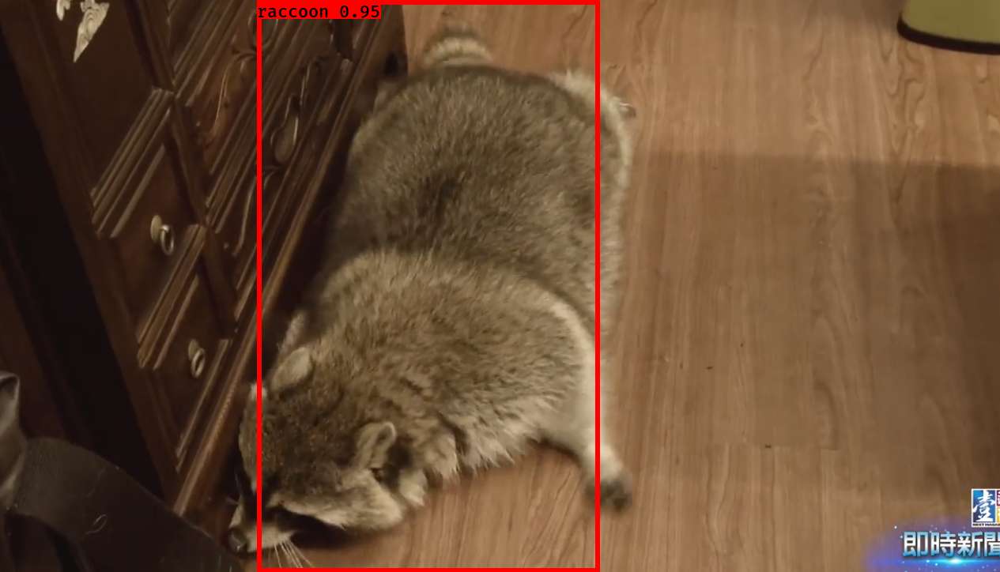

--- ../video_stream/k_4.png ---
(416, 416, 3)
Found 3 boxes for img
raccoon 0.38 (769, 103) (1090, 727)
raccoon 0.47 (66, 0) (353, 727)
kangaroo 0.70 (762, 46) (1117, 712)
0.13759035600014613


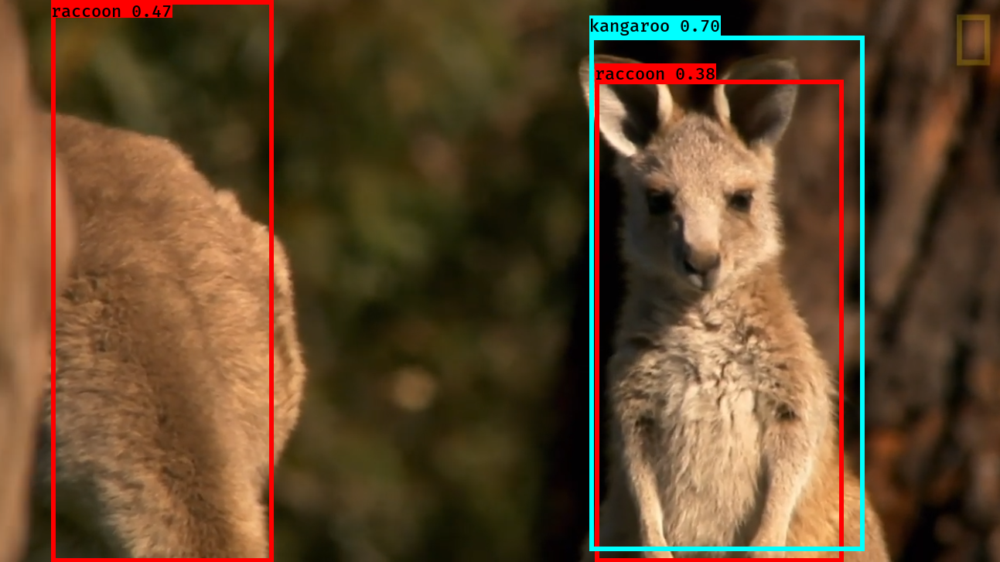

--- ../video_stream/r_5.png ---
(416, 416, 3)
Found 1 boxes for img
raccoon 0.83 (274, 81) (625, 670)
0.13444956999956048


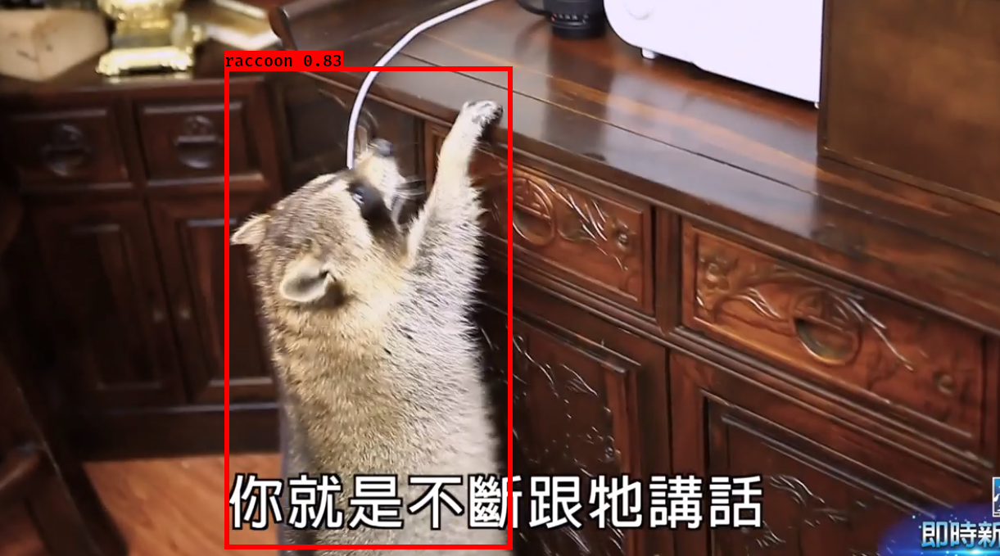

--- ../video_stream/k_3.png ---
(416, 416, 3)
Found 2 boxes for img
kangaroo 0.57 (263, 212) (575, 526)
kangaroo 0.80 (529, 111) (955, 676)
0.12121762300012051


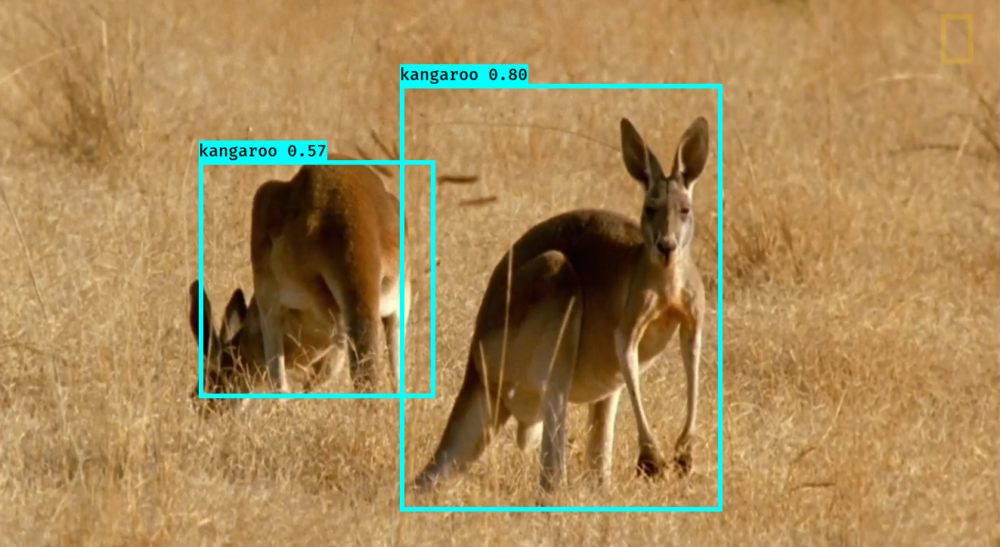

--- ../video_stream/r_1.png ---
(416, 416, 3)
Found 0 boxes for img
0.10983069500070997


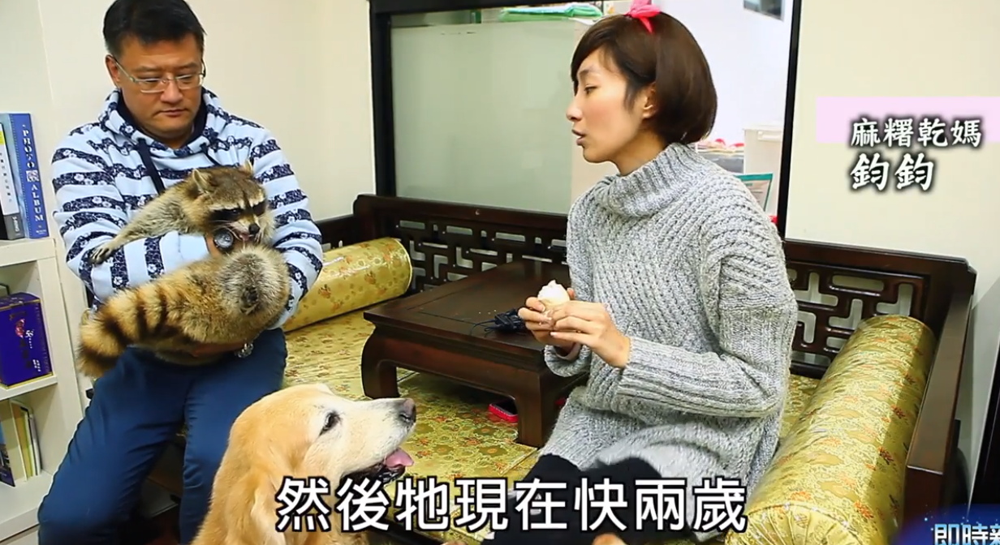

--- ../video_stream/r_3.png ---
(416, 416, 3)
Found 1 boxes for img
raccoon 0.80 (472, 25) (1049, 631)
0.109251955000218


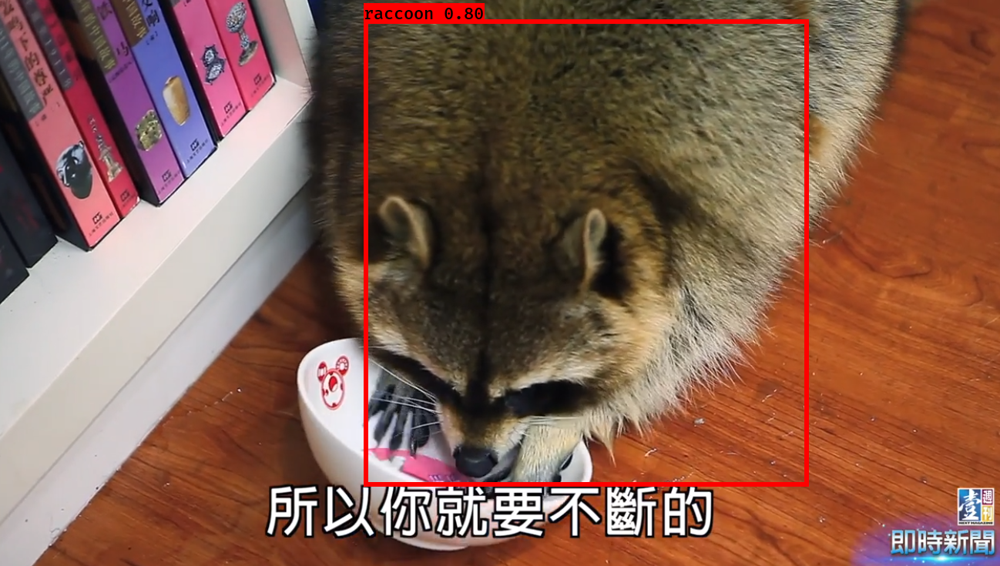

In [29]:
for f in files:  
    image = Image.open(f) 
    print('---', f, '---')
    r_image = yolo_model.detect_image(image)
    display(r_image)